# Traditional Machine Learning with Image Processing

This notebook examines the performance of a number of binary classification algorithms over preprocessed images to detect presentation attacks in face recognition.

## Preprocessing
This notebook loads images and computes the quality vector described in Wen et al. in their paper:

* "Face  spoof  detection  with  image distortion analysis", IEEE Trans. on Information Forensics and Security, vol. 10(4), pp. 746-761, April 2015.
* "Image Quality Assessment for Fake Biometric Detection: Application to Iris, Fingerprint, and Face Recognition", IEEE Trans. on Image Processing Vol 23(2), 2014.

Prior to the generation we normalize the images to 150x150 RGB cropped around the face to ensure consistency.

### Galby quality imaages:

mse00, psnr01, ad02, sc03, nk04, md05, lmse06, nae07, snrv08,  ramdv09, mas10, mams11, sme12,  gme16,  gpe17, ssim18, vif19, hlfi25

* mse00: MSE
* psnr01: PSNR
* ad02: AD: Average difference
* sc03: SC: structural content
* nk04: NK: normalized cross-correlation
* md05: MD: Maximum difference
* lmse06: LMSE: Laplacian MSE
* nae07: NAE: normalized abs. error
* snrv08: SNRv: SNR in db
* ramdv09: RAMDv: R-averaged max diff
* mas10: MAS: Mean Angle Similarity
* mams11: MAMS: Mean Angle-Magnitude Similarity
* sme12: SME: spectral magnitude error
* gme16: GME: gradient-magnitude error
* gpe17: GPE: gradient phase error
* ssim18: SSMI
* vif19: VIF
* hlfi25: HLFI: high-low frequency index


## Computational Data analysis
The preprocessed set is then split into 5 fold cross validation. The same person is in the same fold for all images of them including spoofed and non-spoofed images.

The algorithms executed and assessed for performance are:

* Logistic Regression
* KNN
* SVM
* Naive Bayes
* Simple Neural Network
* Random Forest
* Ada Boost

This completed on the raw dataset and on a reduced dimensionality set using PCA.

## Performance Measurement

The performance across these algorithms is assessed in the following ways

Metrics:
* Area UnderCurve
* Accuray

Visualisation:
* ROC 
* Precision Recall

All metrics are produced on the cross-val output.




In [1]:
from google.oauth2 import service_account
import gcsfs
from PIL import Image
import io
import matplotlib.pyplot as plt
import base64

from bob.ip.qualitymeasure import msu_iqa_features as iqa
from tqdm import tqdm as pbar
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt 

plt.rcParams['figure.figsize'] = [14, 10]

In [2]:
# TODO: Replace msu with galby and describe measures
import bob.ip.qualitymeasure.galbally_iqm_features as galby
# help(galby.compute_quality_features)

In [3]:
# Configre cloud storage connection
key_path = "../cda-gatech-0f0f7b5092d0.json"
credentials = service_account.Credentials.from_service_account_file(
    key_path,
    scopes=["https://www.googleapis.com/auth/cloud-platform"],
)

fs = gcsfs.GCSFileSystem(project='CDA-GATECH', token=credentials)

In [4]:
def stringToRGB(base64_string):
    imgdata = base64.b64decode(base64_string)
    image = Image.open(io.BytesIO(imgdata))
    return np.array(image)

In [5]:
def generate_iqa_features_df(gcs_dir: str, columns_list: list, label: bool, dim: int=150):
    '''Loads images from a google cloud storage bucket and returns a dataframe containing the iqa image quality metrics'''
    image_paths = fs.ls(gcs_dir)[1:] # TODO: Filter these for one each person - a proper spec of the same size as the neg samples
    n_images = len(image_paths)

    iqa_features = []
    processed_path_arr = []
    for v in pbar(image_paths, f'Processing Images for {label}', n_images):
        if '/.' not in v:
            with fs.open(v) as f:
                b64 = base64.b64encode(f.read())
                img = stringToRGB(b64)
                if img.shape[0] == img.shape[1] == dim:  # Process if the image shape is standard
                    iqa_image_arr = galby.compute_quality_features(img.reshape((3,dim,dim)))
                    iqa_features.append(iqa_image_arr)
                    processed_path_arr.append(v)

    df = pd.DataFrame(iqa_features, columns=columns_list)
    df['path'] = processed_path_arr
    df['y'] = label

    return df

In [6]:
quality_measure_names = ['mse00', 'psnr01', 'ad02', 'sc03', 'nk04', 'md05', 'lmse06', 'nae07', 'snrv08', 'ramdv09', 'mas10', 'mams11', 'sme12', 'gme16', 'gpe17', 'ssim18', 'vif19', 'hlfi25']

In [8]:
[x['name'] for x in fs.listdir('cda-project/images/')]

['cda-project/images/',
 'cda-project/images/Dev',
 'cda-project/images/Test',
 'cda-project/images/Train',
 'cda-project/images/test']

In [9]:
# Process primary dfs
df_train_neg = generate_iqa_features_df('cda-project/images/Train/n', quality_measure_names, False)
df_train_pos = generate_iqa_features_df('cda-project/images/Train/p', quality_measure_names, True)

Processing Images for True: 100%|██████████| 1408/1408 [04:12<00:00,  5.57it/s]


In [10]:
# Process primary dfs
df_dev_neg = generate_iqa_features_df('cda-project/images/Dev/n', quality_measure_names, False)
df_dev_pos = generate_iqa_features_df('cda-project/images/Dev/p', quality_measure_names, True)

Processing Images for True: 100%|██████████| 1028/1028 [03:08<00:00,  5.44it/s]


In [11]:
df_train_neg.shape, df_train_pos.shape, df_dev_neg.shape, df_dev_pos.shape

((1329, 20), (1408, 20), (1022, 20), (1028, 20))

In [12]:
# # Transform final dataset
# assert len(df_neg) >= len(df_pos)
# df_neg = df_neg[~df_neg.y].sample(len(df_pos))
initial_train_df = pd.concat([df_train_neg, df_train_pos, df_dev_neg, df_dev_pos])

X = initial_train_df[quality_measure_names].values
y = initial_train_df['y'].values

In [38]:
initial_train_df.to_csv('train_data.csv', index=False)

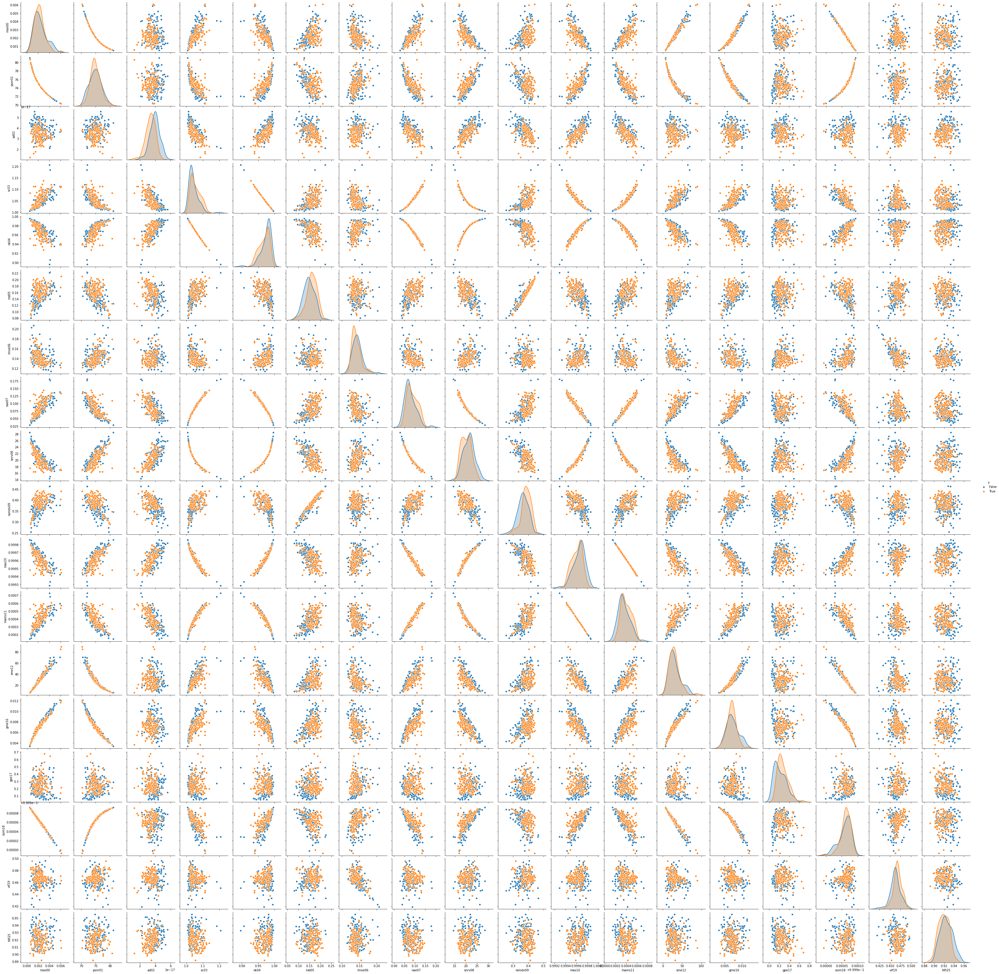

In [68]:
pairplot_fig = sns.pairplot(initial_train_df[quality_measure_names+['y']].sample(300), hue='y')

In [69]:
pairplot_fig.savefig("pairplot.png")

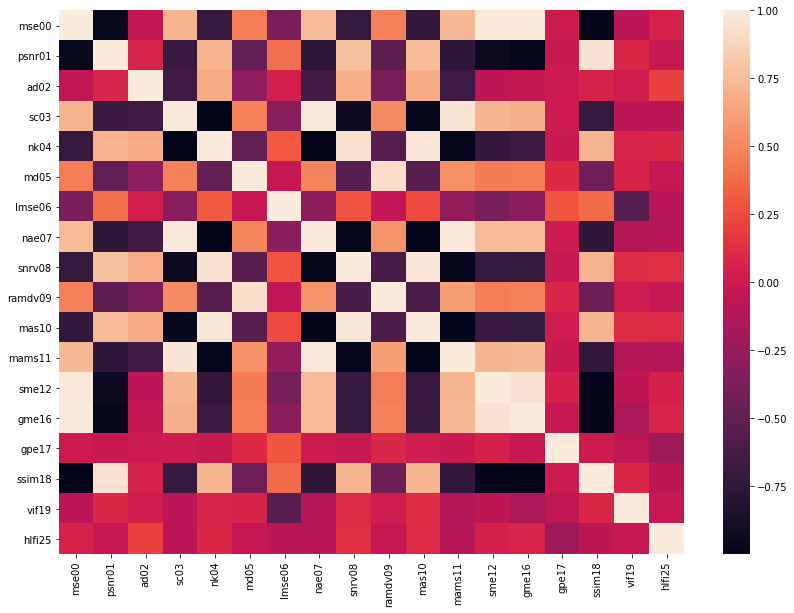

In [14]:
sns.heatmap(initial_train_df[quality_measure_names].corr())

In [15]:
# TODO: Cut unused junk
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.decomposition import PCA

In [16]:
def modelling_run(X_train, y_train, num_folds=5, seed=7, scoring='accuracy'):
    models = []
    models.append(('LR', LogisticRegression()))
    models.append(('LDA', LinearDiscriminantAnalysis()))
    models.append(('KNN', KNeighborsClassifier()))
    models.append(('NB', GaussianNB()))
    models.append(('SVM', SVC()))
    models.append(('NN', MLPClassifier(hidden_layer_sizes=(100, 50))))
    models.append(('AB', AdaBoostClassifier())) 
    models.append(('GBM', GradientBoostingClassifier())) 
    models.append(('RF', RandomForestClassifier()))

    # Complete CV modelling
    results = []
    names = []
    for name, model in models:
        kfold = KFold(n_splits=num_folds, random_state=seed)
        cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
        print(msg)

    return names, results

In [17]:
def plot_results(names, results):
    long_names = np.array([[n]*len(results[0]) for n in names]).flatten()
    long_accuracy = np.array(results).flatten()
    plot_df = pd.DataFrame({'Accuracy': long_accuracy, 'Algorithm': long_names})
    return sns.boxplot(x="Algorithm", y="Accuracy", data=plot_df)

In [18]:
full_names, full_results = modelling_run(X, y)

LR: 0.490908 (0.093605)
LDA: 0.607465 (0.079716)
KNN: 0.474192 (0.072143)
NB: 0.581376 (0.087591)
SVM: 0.146811 (0.186716)
NN: 0.447907 (0.175029)
AB: 0.663868 (0.058265)
GBM: 0.682455 (0.058510)
RF: 0.664262 (0.141546)


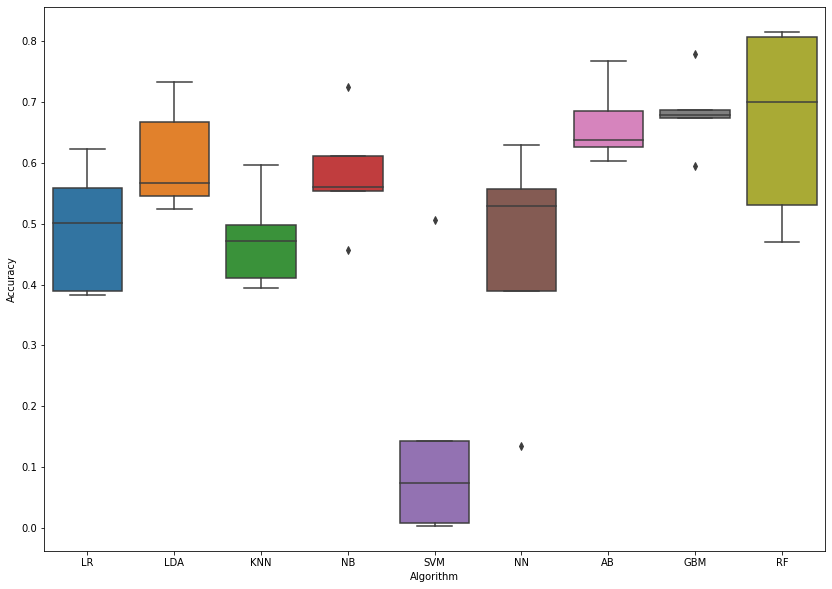

In [19]:
plot_results(full_names, full_results)

In [20]:
pca = PCA(n_components=5)
X_pca = pca.fit_transform(X)

In [21]:
pca_names, pca_results = modelling_run(X_pca, y)

LR: 0.474199 (0.093057)
LDA: 0.480875 (0.092739)
KNN: 0.473357 (0.071674)
NB: 0.493836 (0.102032)
SVM: 0.284716 (0.158674)
NN: 0.580087 (0.076868)
AB: 0.558799 (0.073938)
GBM: 0.564636 (0.072546)
RF: 0.547484 (0.133444)


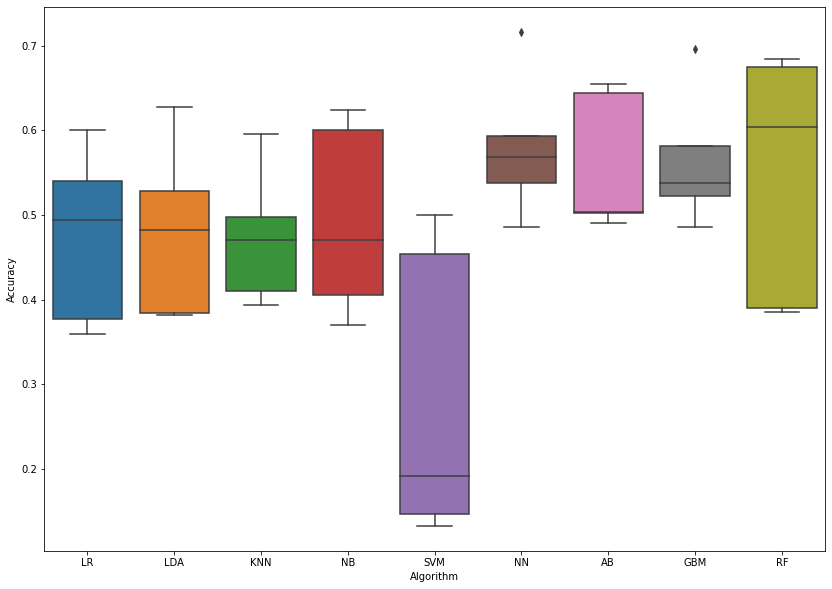

In [22]:
plot_results(pca_names, pca_results)

In [23]:
galbally_best_five = ['mse00', 'psnr01', 'nae07', 'sme12']
X_galbally_five = initial_train_df[galbally_best_five].values

In [24]:
galbally_five_names, galbally_five_results = modelling_run(X_galbally_five, y)

LR: 0.141603 (0.140241)
LDA: 0.337380 (0.131947)
KNN: 0.393756 (0.058608)
NB: 0.389828 (0.164009)
SVM: 0.121340 (0.142876)
NN: 0.287471 (0.323445)
AB: 0.418016 (0.103153)
GBM: 0.398157 (0.087429)
RF: 0.459968 (0.114204)


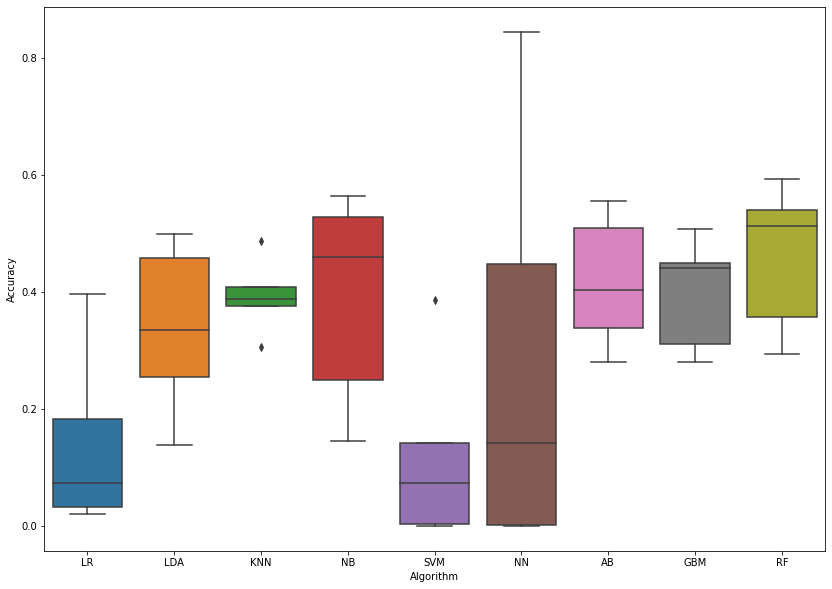

In [25]:
plot_results(galbally_five_names, galbally_five_results)

In [26]:
from sklearn.preprocessing import StandardScaler

In [27]:
# # Tune GBM
# # Tune scaled GBM
# num_folds =  5
# scaler = StandardScaler().fit(X)
# rescaledX = scaler.transform(X)
# param_grid = dict(n_estimators=np.array([x*50 for x in  range(1,20)]))
# model = GradientBoostingClassifier(random_state=42)
# kfold = KFold(n_splits=num_folds, random_state=42)
# grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=kfold)
# grid_result = grid.fit(rescaledX, y)

# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# means = grid_result.cv_results_['mean_test_score']
# stds = grid_result.cv_results_['std_test_score']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

In [28]:
# Tune AB
num_folds =  5
# scaler = StandardScaler().fit(X)
# rescaledX = scaler.transform(X)
param_grid = dict(n_estimators=np.array([x*50 for x in  range(1,20)]))
model = AdaBoostClassifier(random_state=42)
kfold = KFold(n_splits=num_folds, random_state=42)
grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=kfold)
grid_result = grid.fit(X, y)

print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.671178 using {'n_estimators': 900}
0.663868 (0.058265) with: {'n_estimators': 50}
0.670136 (0.048434) with: {'n_estimators': 100}
0.670552 (0.051520) with: {'n_estimators': 150}
0.668880 (0.049946) with: {'n_estimators': 200}
0.670968 (0.052855) with: {'n_estimators': 250}
0.667625 (0.051903) with: {'n_estimators': 300}
0.665536 (0.051994) with: {'n_estimators': 350}
0.660936 (0.059080) with: {'n_estimators': 400}
0.668459 (0.055454) with: {'n_estimators': 450}
0.666998 (0.054713) with: {'n_estimators': 500}
0.660312 (0.060602) with: {'n_estimators': 550}
0.660311 (0.061656) with: {'n_estimators': 600}
0.660937 (0.060788) with: {'n_estimators': 650}
0.661356 (0.060135) with: {'n_estimators': 700}
0.668669 (0.056777) with: {'n_estimators': 750}
0.669924 (0.056573) with: {'n_estimators': 800}
0.670342 (0.054828) with: {'n_estimators': 850}
0.671178 (0.054759) with: {'n_estimators': 900}
0.666165 (0.054720) with: {'n_estimators': 950}


In [29]:
# Tune RF
num_folds =  5
# scaler = StandardScaler().fit(X)
# rescaledX = scaler.transform(X)
param_grid = dict(n_estimators=np.array([x*50 for x in  range(1,10)]), max_depth=np.array([x*10 for x in range(1,20)]))
model = RandomForestClassifier(random_state=42)
kfold = KFold(n_splits=num_folds, random_state=42)
grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring='accuracy', cv=kfold)
grid_result = grid.fit(X, y)

print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.666570 using {'max_depth': 10, 'n_estimators': 200}
0.663229 (0.071176) with: {'max_depth': 10, 'n_estimators': 50}
0.665317 (0.074164) with: {'max_depth': 10, 'n_estimators': 100}
0.665944 (0.071151) with: {'max_depth': 10, 'n_estimators': 150}
0.666570 (0.072041) with: {'max_depth': 10, 'n_estimators': 200}
0.662811 (0.070084) with: {'max_depth': 10, 'n_estimators': 250}
0.663019 (0.074380) with: {'max_depth': 10, 'n_estimators': 300}
0.663228 (0.071527) with: {'max_depth': 10, 'n_estimators': 350}
0.662183 (0.074257) with: {'max_depth': 10, 'n_estimators': 400}
0.660302 (0.076942) with: {'max_depth': 10, 'n_estimators': 450}
0.662382 (0.138479) with: {'max_depth': 20, 'n_estimators': 50}
0.662175 (0.134311) with: {'max_depth': 20, 'n_estimators': 100}
0.659877 (0.136313) with: {'max_depth': 20, 'n_estimators': 150}
0.663223 (0.128946) with: {'max_depth': 20, 'n_estimators': 200}
0.662595 (0.130702) with: {'max_depth': 20, 'n_estimators': 250}
0.662176 (0.132829) with: {'max_

In [30]:
model = AdaBoostClassifier(n_estimators=900, random_state=42)
cv_results = cross_val_score(model, X, y, cv=kfold, scoring='accuracy')
cv_results.mean(), cv_results.std()

(0.6711775446495769, 0.05475880064947187)

In [33]:
final_scaler = StandardScaler().fit(X)
model = AdaBoostClassifier(n_estimators=900, random_state=42)
cv_results = cross_val_score(model, final_scaler.transform(X), y, cv=kfold, scoring='accuracy')
cv_results.mean(), cv_results.std()

(0.6676232485389493, 0.06961187362777997)

In [34]:
final_model =  AdaBoostClassifier(n_estimators=450, random_state=42)
final_model.fit(X, y)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=450, random_state=42)

In [35]:
# Process primary dfs
df_neg = generate_iqa_features_df('cda-project/images/Test/n', quality_measure_names, False)
df_pos = generate_iqa_features_df('cda-project/images/Test/p', quality_measure_names, True)

Processing Images for True: 100%|██████████| 1256/1256 [03:54<00:00,  5.36it/s]


In [36]:
test_df = pd.concat([df_neg, df_pos])

X_test = test_df[quality_measure_names].values
y_test = test_df['y'].values

In [39]:
test_df.to_csv('test_data.csv', index=False)

In [45]:
# test_predictions = final_model.predict(scaler.transform(X_test))
test_predictions = final_model.predict_proba(X_test)

In [48]:
test_predictions[:5]

array([[0.50321417, 0.49678583],
       [0.50309174, 0.49690826],
       [0.50207253, 0.49792747],
       [0.50084218, 0.49915782],
       [0.5130999 , 0.4869001 ]])

In [51]:
# help(accuracy_score)

In [53]:
accuracy_score(y_test, test_predictions[:,1]>0.5)

0.726016581129096

In [54]:
test_df['final_predictions_adaboost'] = test_predictions[:,1]

In [55]:
test_df[['path', 'y', 'final_predictions_adaboost']].to_csv('model_predictions.csv', index=False)